In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from scipy.signal import sawtooth
import scipy.optimize
from scipy.stats import moment

In [3]:
import iminuit

In [4]:
from iminuit import minimize  # has same interface as scipy.optimize.minimize
from iminuit import Minuit, describe

# we also need a cost function to fit and import the LeastSquares function
from iminuit.cost import LeastSquares
from iminuit.cost import UnbinnedNLL

from iminuit.typing import Annotated, Gt

%config InlineBackend.figure_formats = ['svg']


print("iminuit version:", iminuit.__version__)

iminuit version: 2.30.0


In [5]:
def sinus(x, A, omega, phi0):
    y = A*np.sin(omega*x + phi0)
    return y

def saw(x, A, omega, phi0):
    y = A*sawtooth(omega*x + phi0)
    return y

def chisquare(x, y, yerr, model, A, omega, phi0):
    L = len(x)
    chi2 = 0

    for i in range(L):
        y_model = model(x[i], A, omega, phi0)
        chi2 += (y[i] - y_model)**2 / yerr[i]**2

    return chi2

In [6]:
import re

In [7]:
def extract_values(filename):
    # Regex to match the required keys and capture their numeric values
    pattern = re.compile(
        r'\btau=([+-]?\d+(?:\.\d+)?)\b|'
        r'\bamp=([+-]?\d+(?:\.\d+)?)\b|'
        r'\blc_length_years=([+-]?\d+(?:\.\d+)?)\b|'
        r'\bwindow_start(?:_day)?=([+-]?\d+(?:\.\d+)?)\b'
    )

    results = {
        'tau': None,
        'amp': None,
        'lc_length_years': None,
        'window_start': None
    }

    with open(filename, 'r', encoding='utf-8') as f:
        first_line = f.readline()
        for match in pattern.finditer(first_line):
            if match.group(1) is not None:
                results['tau'] = float(match.group(1))
            elif match.group(2) is not None:
                results['amp'] = float(match.group(2))
            elif match.group(3) is not None:
                results['lc_length_years'] = float(match.group(3))
            elif match.group(4) is not None:
                results['window_start'] = float(match.group(4))
    return results


Over 1000 files

In [33]:
ic_omegas=[0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12]

In [34]:
chi2_sins = []
chi2_saws = []

par_sins = []
par_saws = []

for ic_omega in ic_omegas:
    chi2_sin = []
    chi2_saw = []
    
    par_sin = []
    par_saw = []
    
    for i in range(0,1000):
        
        file = 'lc_%04d.txt' % i
            
        data = pd.read_csv(file, sep="\s+", header=None, skiprows=2)
        data.columns = ['time','flux','flux_err']
    
        least_squares = LeastSquares(data['time'],data['flux'],data['flux_err'], sinus)
        
        m = Minuit(least_squares, A=1, omega=ic_omega, phi0=0)  # starting values for α and β
        m.limits['A'] = (1e-4,(max(data['flux'])-min(data['flux']))/2)
        m.limits['omega'] = (np.pi/(max(data['time'])-min(data['time'])), 2*np.pi*3)
        
        m.migrad()  # finds minimum of least_squares function
        m.hesse()
    
        par_sin = np.append(par_sin, m.values)
        chi2_sin = np.append(chi2_sin, m.fval/(len(data['time'])-m.nfit))
        
        least_squares2 = LeastSquares(data['time'],data['flux'],data['flux_err'], saw)
        
        m2 = Minuit(least_squares2, A=1, omega=ic_omega, phi0=0)  # starting values for α and β
        m2.limits['A'] = (1e-4,(max(data['flux'])-min(data['flux']))/2)
        m2.limits['omega'] = (np.pi/(max(data['time'])-min(data['time'])), 2*np.pi*3)
        
        m2.migrad()  # finds minimum of least_squares function
        m2.hesse()
    
        par_saw = np.append(par_saw, m2.values)
        chi2_saw = np.append(chi2_saw,m2.fval/(len(data['time'])-m2.nfit))

        
    chi2_sins.append(chi2_sin)
    chi2_saws.append(chi2_saw)

    par_sins.append(par_sin)
    par_saws.append(par_saw)

In [35]:
np.shape(chi2_sins)
np.shape(par_saws)

(13, 3000)

In [44]:
np.shape(chi2_saws)
np.shape(par_saws)
par_saws[0][0]

0.07172836936656828

In [37]:
par_sins = np.array(par_sins)
par_saws = np.array(par_saws)

In [133]:
fig, ax = plt.subplots(1,3, figsize=(11,4))
x = range(0,1000)
for iguess, nameguess in zip(range(np.shape(par_saws)[0]),ic_omegas):
    for i, name in zip(range(3), ['A',r'$\omega$',r'$\phi$']):
        ax[i].scatter(x,par_sins[iguess][i::3],label=str(nameguess),marker='.')
        #ax[i].scatter(x,par_saw[iguess][i::3],label='sawtooth',marker='.')
        ax[i].set_title(name)
        ax[i].set_yscale('log')
        ax[i].set_ylabel(name)
        ax[i].set_xlabel('dataset')
        ax[i].legend()
plt.tight_layout()


In [134]:
fig, ax = plt.subplots(1,3, figsize=(11,4))
for iguess, nameguess in zip(range(np.shape(par_saws)[0]),ic_omegas):
    for i, name in zip(range(3), ['A',r'$\omega$',r'$\phi$']):
        #ax[i].scatter(x,par_sins[iguess][i::3],label=str(nameguess),marker='.')
        ax[i].scatter(x,par_saws[iguess][i::3],label=str(nameguess),marker='.')
        ax[i].set_title(name)
        ax[i].set_yscale('log')
        ax[i].set_ylabel(name)
        ax[i].set_xlabel('dataset')
        ax[i].legend()
plt.tight_layout()


In [139]:
chi2_saws[iguess].shape

(1000,)

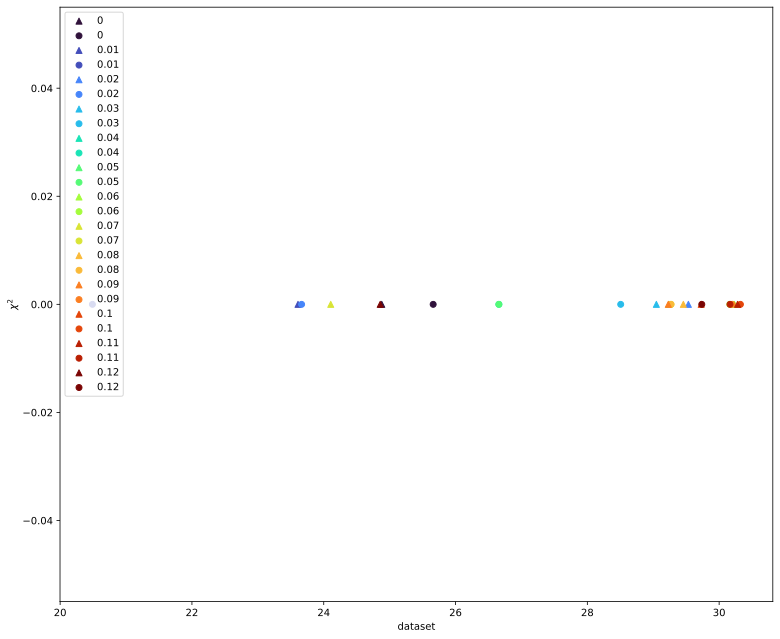

In [152]:
cmap = plt.get_cmap('turbo')

colors = [cmap(i) for i in np.linspace(0,1,len(ic_omegas))]


fig, ax = plt.subplots(1, figsize=(11,9))
for iguess, nameguess in zip(range(np.shape(par_saws)[0]),ic_omegas):

    ax.scatter(chi2_saws[iguess][0],x[0],label=str(nameguess),marker='^',color=colors[iguess])
    ax.scatter(chi2_sins[iguess][0],x[0],label=str(nameguess),marker='o',color=colors[iguess])
    #ax.set_yscale('log')
    ax.set_ylabel(r'$\chi^2$')
    ax.set_xlabel('dataset')
    ax.legend()
    plt.plot()
plt.tight_layout()

In [59]:
fig, ax = plt.subplots(figsize=(11,9))


cmap = plt.get_cmap('jet')

colors = [cmap(i) for i in np.linspace(0,1,len(ic_omegas))]
for iguess, nameguess in zip(range(np.shape(par_saws)[0]),ic_omegas):
    plt.scatter(x,par_sins[iguess][::3],label=r'sin $\omega$ = '+str(nameguess),marker='.',color=colors[iguess])
    plt.scatter(x,par_saws[iguess][::3],label=r'sawtooth $\omega$ = '+str(nameguess),marker='*',color=colors[iguess])
    plt.yscale('log')
    plt.ylabel(r'$\omega$')
    plt.xlabel('dataset')
    plt.legend()
plt.tight_layout()


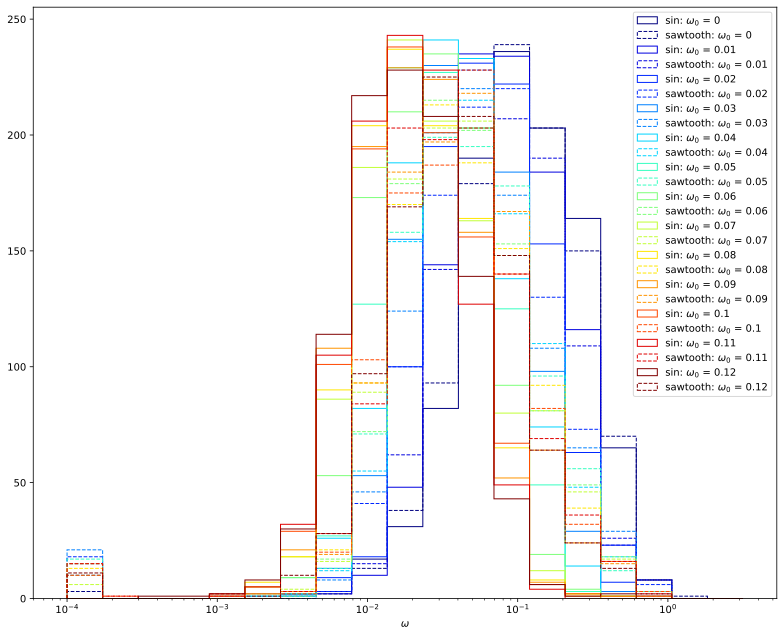

In [143]:
fig, ax = plt.subplots(figsize=(11,9))

#bins = [1e-4,1e-3,1e-2,1.5e-2,2.5e-2,3.5e-2,4.5e-2,5.5e-2,6.5e-2,7.5e-2,8.5e-2,9.5e-2,1.5e-1,2.5e-1,3.5e-1,4.5e-1,5.5e-1,6.5e-1,7.5e-1,8.5e-1,9.5e-1,1,2]
bins = np.logspace(-4,0.5,20)

cmap = plt.get_cmap('jet')

colors = [cmap(i) for i in np.linspace(0,1,len(ic_omegas))]
for iguess, nameguess in zip(range(np.shape(par_saws)[0]),ic_omegas):
    plt.hist(par_sins[iguess][::3],bins=bins,label=r'sin: $\omega_0$ = '+str(nameguess),color=colors[iguess],histtype='step')
    plt.hist(par_saws[iguess][::3],bins=bins,label=r'sawtooth: $\omega_0$ = '+str(nameguess),color=colors[iguess],histtype='step',linestyle='--')
    #plt.yscale('log')   
    plt.xscale('log') 
    plt.xlabel(r'$\omega$')

    plt.legend()
plt.tight_layout()

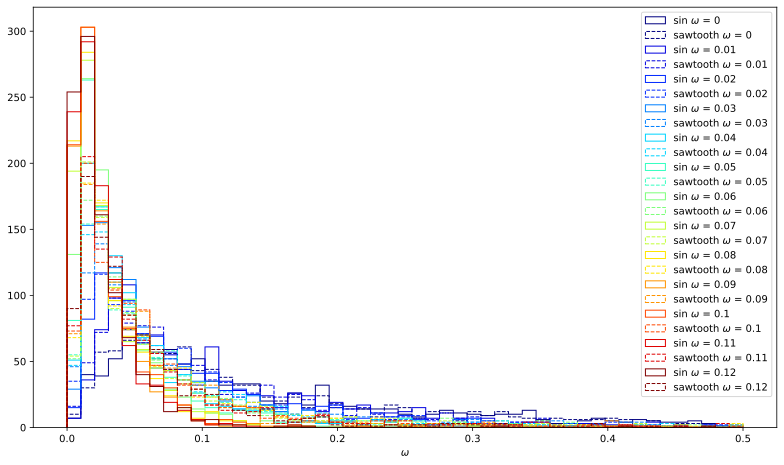

In [153]:
fig, ax = plt.subplots(figsize=(11,7))

bins = np.linspace(0,0.5,50)

cmap = plt.get_cmap('jet')

colors = [cmap(i) for i in np.linspace(0,1,len(ic_omegas))]
for iguess, nameguess in zip(range(np.shape(par_saws)[0]),ic_omegas):
    plt.hist(par_sins[iguess][::3],bins=bins,label=r'sin $\omega$ = '+str(nameguess),color=colors[iguess],histtype='step')
    plt.hist(par_saws[iguess][::3],bins=bins,label=r'sawtooth $\omega$ = '+str(nameguess),color=colors[iguess],histtype='step',linestyle='--')
    #plt.yscale('log')   
    #plt.xscale('log') 
    plt.xlabel(r'$\omega$')

    plt.legend()
plt.tight_layout()

In [87]:
for iguess in range(np.shape(par_saws)[0]):
    #print(np.mean(chi2_saws[iguess]-chi2_sins[iguess]))
    sin_counter = 0
    saw_counter = 0
    for i in range(len(chi2_sins[iguess])):
        if chi2_sins[iguess][i]<chi2_saws[iguess][i]: sin_counter+=1
        else: saw_counter+=1
    print(iguess)
    print('for omega0 = %.2f sinusoidal function is a better descriptor in %d / %d of cases' % (ic_omegas[iguess], sin_counter, len(chi2_sins[iguess])))
    print('for omega0 = %.2f sawtooth function is a better descriptor in %d / %d of cases' % (ic_omegas[iguess], saw_counter, len(chi2_sins[iguess])))

0
for omega0 = 0.00 sinusoidal function is a better descriptor in 625 / 1000 of cases
for omega0 = 0.00 sawtooth function is a better descriptor in 375 / 1000 of cases
1
for omega0 = 0.01 sinusoidal function is a better descriptor in 667 / 1000 of cases
for omega0 = 0.01 sawtooth function is a better descriptor in 333 / 1000 of cases
2
for omega0 = 0.02 sinusoidal function is a better descriptor in 658 / 1000 of cases
for omega0 = 0.02 sawtooth function is a better descriptor in 342 / 1000 of cases
3
for omega0 = 0.03 sinusoidal function is a better descriptor in 572 / 1000 of cases
for omega0 = 0.03 sawtooth function is a better descriptor in 428 / 1000 of cases
4
for omega0 = 0.04 sinusoidal function is a better descriptor in 545 / 1000 of cases
for omega0 = 0.04 sawtooth function is a better descriptor in 455 / 1000 of cases
5
for omega0 = 0.05 sinusoidal function is a better descriptor in 431 / 1000 of cases
for omega0 = 0.05 sawtooth function is a better descriptor in 569 / 1000 o

In [157]:
chi2_sins = np.array(chi2_sins)
chi2_saws = np.array(chi2_saws)
par_sins = np.array(par_sins)
par_saws = np.array(par_saws)
np.argmin(chi2_sins[:,1])


2

In [112]:
best_o0_index_sin = []
best_o0_index_saw = []
for imodel in range(1000):
    best_o0_index_sin.append(np.argmin(chi2_sins[:,imodel]))
    best_o0_index_saw.append(np.argmin(chi2_saws[:,imodel]))
    

In [176]:
periods_sin_best = []
periods_sin = []
periods_saw_best = []
for i in range(1000):
    if chi2_sins[best_o0_index_sin[i],i]<chi2_saws[best_o0_index_saw[i],i]: 
        periods_sin_best = np.append(periods_sin_best,2*np.pi/par_sins[best_o0_index_sin[i],i*3])
    else:
        periods_saw_best = np.append(periods_saw_best,2*np.pi/par_saws[best_o0_index_saw[i],i*3])

    periods_sin = np.append(periods_sin, 2*np.pi/par_sins[best_o0_index_sin[i],i*3])

In [171]:
np.mean(periods_saw_best)

53.99202435101594

[]

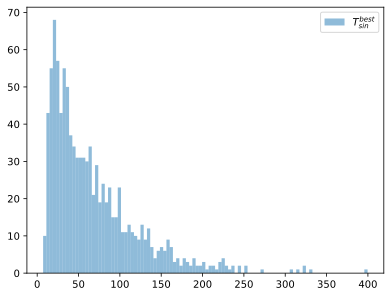

In [177]:
plt.hist(periods_sin,100,alpha=0.5,label=r'$T^{best}_{sin}$')

plt.legend()
plt.plot()

[]

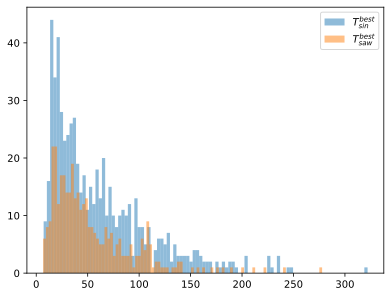

In [174]:
plt.hist(periods_sin_best,100,alpha=0.5,label=r'$T^{best}_{sin}$')
plt.hist(periods_saw_best,100,alpha=0.5,label=r'$T^{best}_{saw}$')

plt.legend()
plt.plot()

In [120]:
sin_counter = 0
saw_counter = 0
chi_best_sin = []
chi_best_saw = []
for i in range(1000):
    if chi2_sins[best_o0_index_sin[i],i]<chi2_saws[best_o0_index_saw[i],i]: 
        sin_counter+=1
    else: saw_counter+=1
    chi_best_sin = np.append(chi_best_sin,chi2_sins[best_o0_index_sin[i],i])
    chi_best_saw = np.append(chi_best_saw,chi2_saws[best_o0_index_saw[i],i])
print('sinusoidal function is a better descriptor in %d / %d of cases' % (sin_counter, len(chi2_sins[0])))
print('sawtooth function is a better descriptor in %d / %d of cases' % (saw_counter, len(chi2_sins[0])))

sinusoidal function is a better descriptor in 632 / 1000 of cases
sawtooth function is a better descriptor in 368 / 1000 of cases


(array([808., 127.,  48.,  11.,   2.,   3.,   0.,   0.,   0.,   1.]),
 array([   2.02059344,  194.31883235,  386.61707126,  578.91531017,
         771.21354908,  963.51178799, 1155.8100269 , 1348.10826581,
        1540.40650472, 1732.70474363, 1925.00298254]),
 <BarContainer object of 10 artists>)

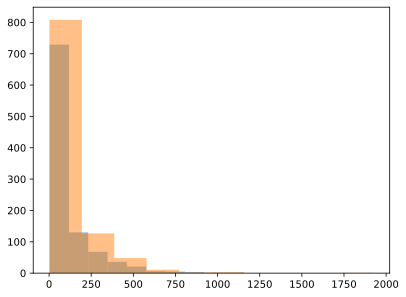

In [121]:
plt.hist(chi_best_sin,10,alpha=0.5,label=r'$\chi^2_{sin}$')
plt.hist(chi_best_saw,10,alpha=0.5,label=r'$\chi^2_{saw}$')

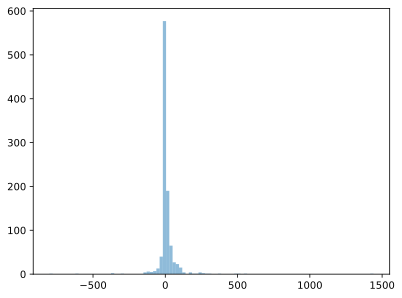

In [145]:
plt.hist(chi_best_saw-chi_best_sin,100,alpha=0.5,label=r'$\chi^2_{saw}-\chi^2_{sin}$')
plt.show()

In [126]:
np.mean(chi_best_saw-chi_best_sin),np.var(chi_best_saw-chi_best_sin),scipy.stats.skew(chi_best_saw-chi_best_sin),scipy.stats.kurtosis(chi_best_saw-chi_best_sin)

(9.946388919467141, 6001.995774091902, 5.6387743311605645, 138.2382972653305)

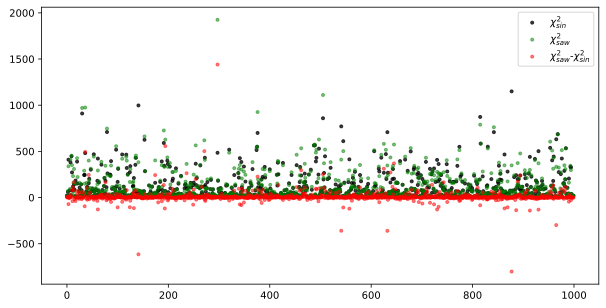

In [141]:
plt.subplots(figsize=(10,5))


x = np.arange(0,len(chi2_sin))
plt.scatter(x,chi_best_sin,marker='.',color='k',alpha=0.75,label=r'$\chi^2_{sin}$')
plt.scatter(x,chi_best_saw,marker='.',color='g',alpha=0.5,label=r'$\chi^2_{saw}$')
plt.scatter(x,chi_best_saw-chi_best_sin,marker='.',color='r',alpha=0.5,label=r'$\chi^2_{saw}$-$\chi^2_{sin}$')
plt.legend()

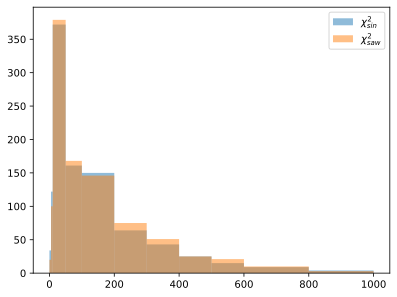

In [129]:
plt.hist(chi_best_sin,bins=[0,5,10,50,100,200,300,400,500,600,800,1000],alpha=0.5,label=r'$\chi^2_{sin}$')
plt.hist(chi_best_saw,bins=[0,5,10,50,100,200,300,400,500,600,800,1000],alpha=0.5,label=r'$\chi^2_{saw}$')
plt.legend()

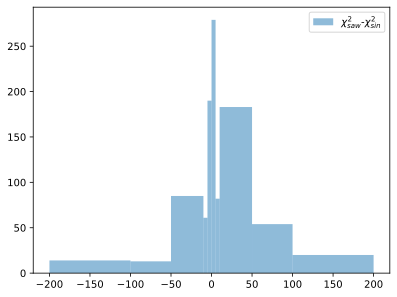

In [130]:
plt.hist(chi_best_saw-chi_best_sin,bins=[-200,-100,-50,-10,-5,0,5,10,50,100,200],alpha=0.5,label=r'$\chi^2_{saw}$-$\chi^2_{sin}$')
plt.legend()

In [131]:
mean = np.mean(chi_best_saw-chi_best_sin)
mean

9.946388919467141

[]

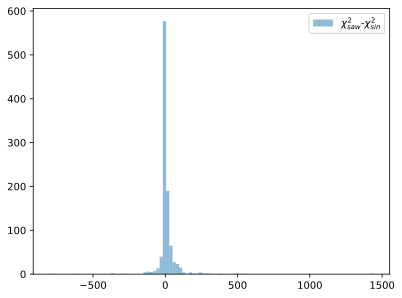

In [144]:
plt.hist(chi_best_saw-chi_best_sin,100,alpha=0.5,label=r'$\chi^2_{saw}$-$\chi^2_{sin}$')
plt.legend()
plt.plot()
#plt.xlim(-100,150)

In [192]:
print('Distribution parameters: \nmean: %.3f \nvaraince: %.3f \nskewness: %.3f\nkurtosis: %.f' % (np.mean(chi_best_saw-chi_best_sin),np.var(chi_best_saw-chi_best_sin),scipy.stats.skew(chi_best_saw-chi_best_sin),scipy.stats.kurtosis(chi_best_saw-chi_best_sin)))

Distribution parameters: 
mean: 9.946 
varaince: 6001.996 
skewness: 5.639
kurtosis: 138
